In [3]:
import os 
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pdb
from pyarrow import feather
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from scipy import spatial
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score
from scipy.stats import pearsonr as cor
from matplotlib import cm


plt.rcParams.update({'font.size': 10})
plt.rcParams["figure.figsize"] = (10, 10)
#%matplotlib notebook

In [5]:
#move up in directory
os.chdir('../')

from helpers import dot2_

In [131]:
os.getcwd()

'C:\\Users\\Bio_Psych\\Desktop\\Deniz\\tf-cpu\\p1_generalization'

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


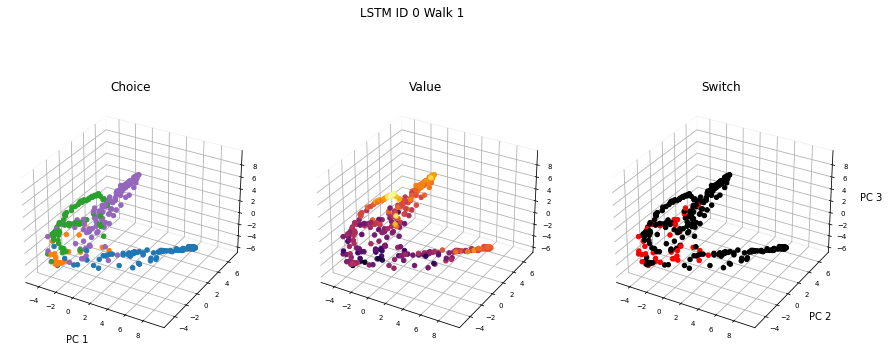

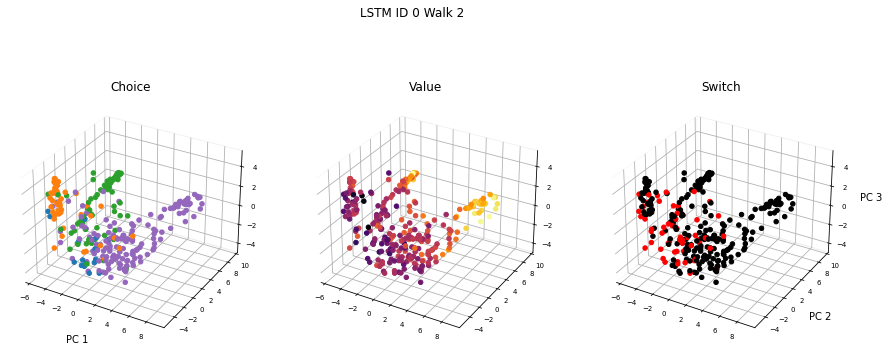

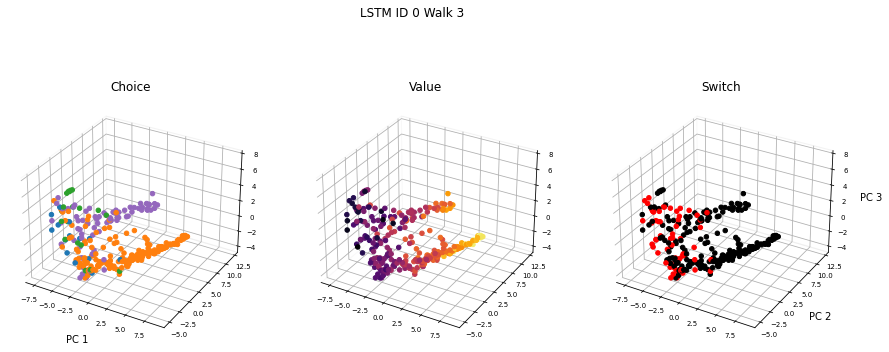

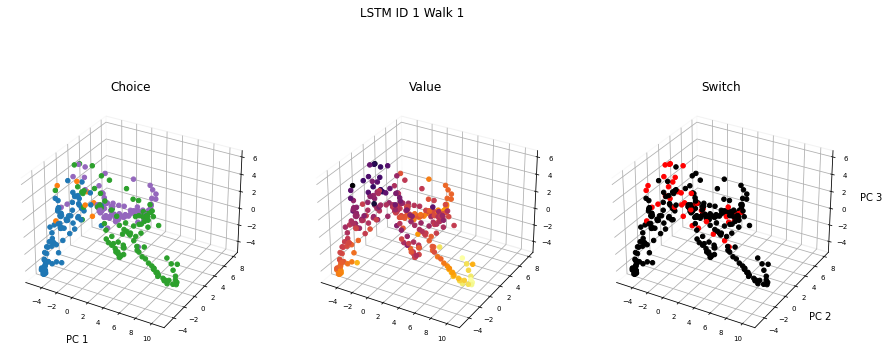

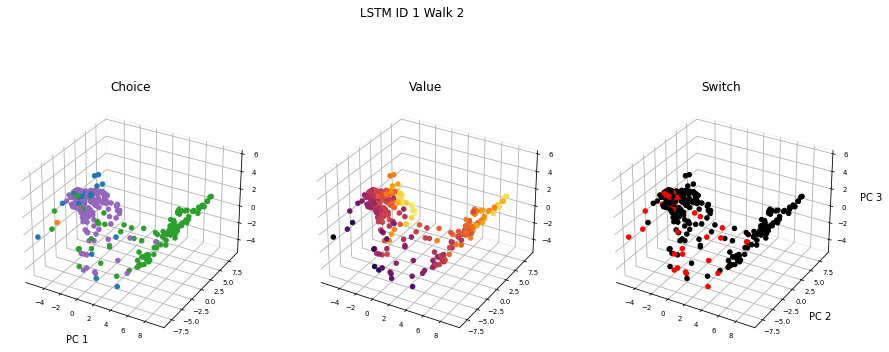

...

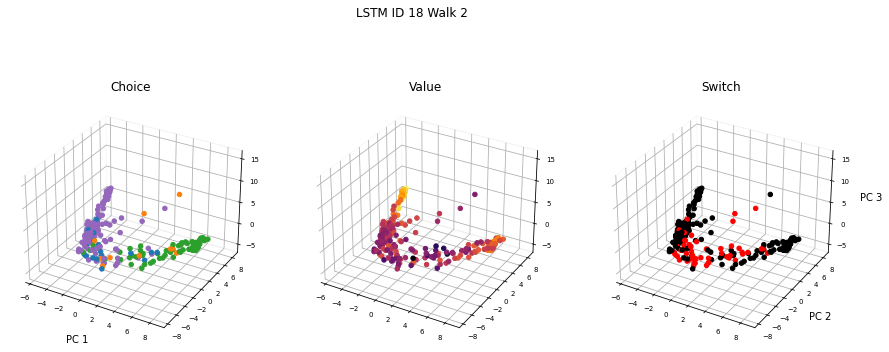

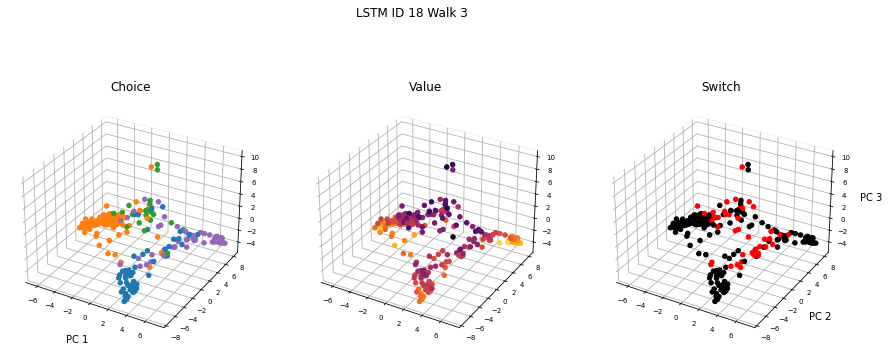

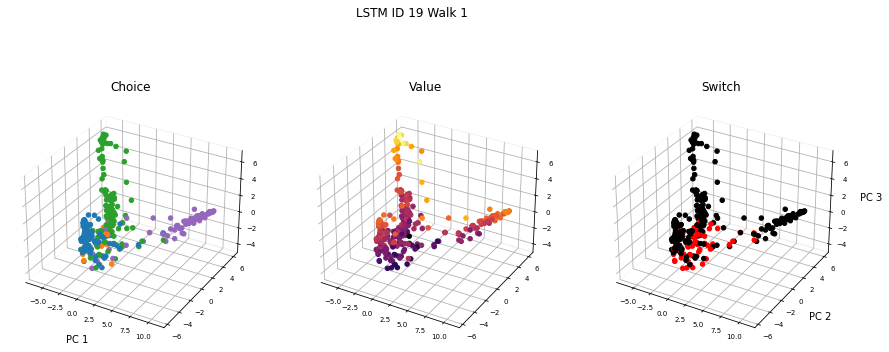

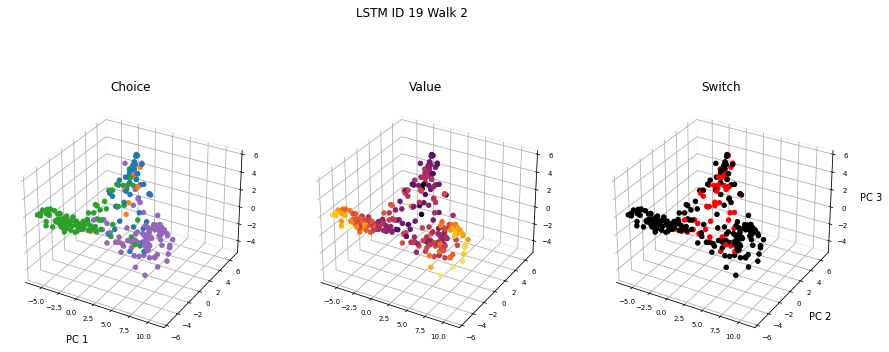

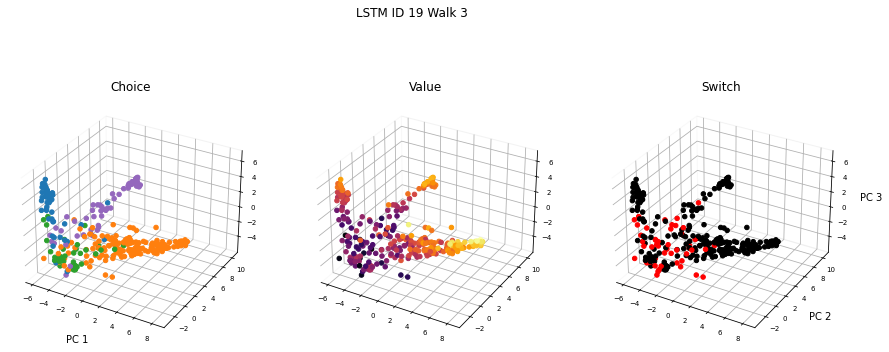

In [132]:
num_ins = 20
n_walks = 3

i = 0

for id_ in range(num_ins):
    for walk in range(1, n_walks+1):
        #


        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()



        ### calculate PCs
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = StandardScaler().fit_transform(hidden_units)  

        pcs = pca.fit_transform(st_hidden)

        # get x,y,z coordinates
        X = pcs[:,0]
        Y = pcs[:,1]
        Z = pcs[:,2]

        fig = plt.figure(figsize=(15,15))

        fig.suptitle('LSTM ID {} Walk {}'.format(id_, walk), y = 0.7)

        # create color for actions
        my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']

        ch_col = []

        for col in range(df['choice'].shape[0]):
            ch_col.append(my_cols[int(df['choice'].iloc[col])])

        # create color for switches
        my_cols = ['black', 'red']

        sw_col = []

        for col in range(df['is_switch'].shape[0]):
            sw_col.append(my_cols[int(df['is_switch'].iloc[col])])

        #First plot
        ax = fig.add_subplot(131, projection='3d')

        ax.scatter(X,Y,Z, color= ch_col, alpha = 1)
        
        
        # centroids
#         centroids = np.zeros([4, 3])
        
#         for action in range(4):
#             centroids[action,:] = [np.mean(X[df['choice'].values == action]),np.mean(Y[df['choice'].values == action]),np.mean(Z[df['choice'].values == action])]
        
#         ax.scatter(centroids[0,0],centroids[0,1], centroids[0,2], color= my_cols[0], alpha = 1)
#         ax.scatter(centroids[1,0],centroids[1,1], centroids[1,2], color= my_cols[1], alpha = 1)
#         ax.scatter(centroids[2,0],centroids[2,1], centroids[2,2], color= my_cols[2], alpha = 1)
#         ax.scatter(centroids[3,0],centroids[3,1], centroids[3,2], color= my_cols[3], alpha = 1)

        ax.set_title('Choice')

        # styling
        ax.grid(True) 
        ax.w_xaxis.pane.fill = False
        ax.w_yaxis.pane.fill = False
        ax.w_zaxis.pane.fill = False

        # labels
        ax.set_xlabel('PC 1')
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

        ax = fig.add_subplot(132, projection='3d')

        x = ax.scatter(X,Y,Z, c= df['value'], alpha = 1, cmap = 'inferno', label = 'Value')

        ax.set_title('Value')
        #fig.colorbar(x, ax=ax)

        # styling
        ax.grid(True) 
        ax.w_xaxis.pane.fill = False
        ax.w_yaxis.pane.fill = False
        ax.w_zaxis.pane.fill = False

        # labels
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

        ax = fig.add_subplot(133, projection='3d')

        ax.scatter(X,Y,Z, color = sw_col, alpha = 1)

        ax.set_title('Switch')

        # styling
        ax.grid(True) 
        ax.w_xaxis.pane.fill = False
        ax.w_yaxis.pane.fill = False
        ax.w_zaxis.pane.fill = False

        # labels
        ax.set_ylabel('PC 2')
        ax.set_zlabel('PC 3')
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)
        
        
        # trial structure
 
#         ax = fig.add_subplot(111, projection='3d')

#         for i in range(1,10): #plot each point + it's index as text above
#             ax.text(X[i-1],Y[i-1],Z[i-1],  '%s' % (str(i)), size=10, zorder=1,  
#             color='k') 
#         viridis = cm.get_cmap('viridis', 300)
    
    
#         plot = ax.scatter(X, Y, Z, c = viridis.colors)
        
#         # styling
#         ax.grid(True) 
#         ax.w_xaxis.pane.fill = False
#         ax.w_yaxis.pane.fill = False
#         ax.w_zaxis.pane.fill = False

#         # labels
#         ax.set_ylabel('PC 2')
#         ax.set_zlabel('PC 3')
#         ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
#         ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
#         ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)
        
#         fig.colorbar(plot)




<IPython.core.display.Javascript object>


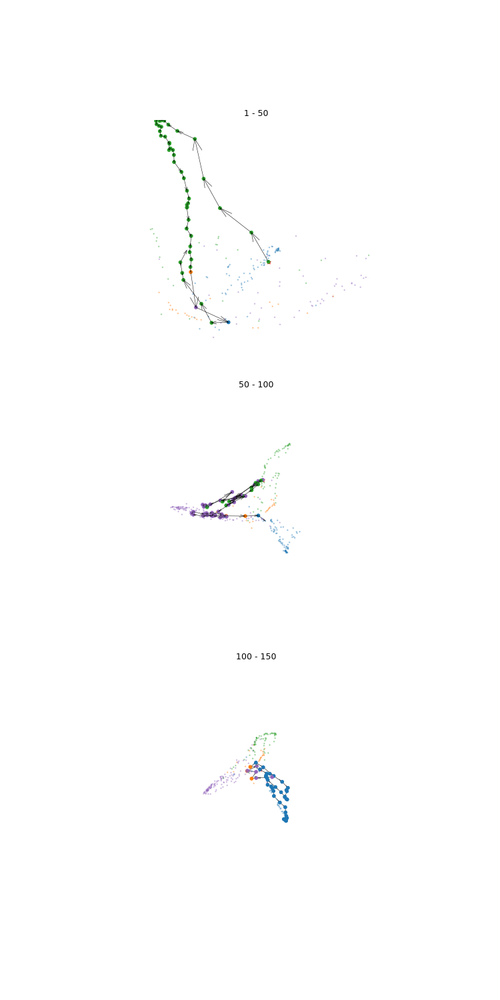

In [97]:
num_ins = 20
n_walks = 3

i = 0

# for id_ in range(num_ins):
#     for walk in range(1, n_walks+1):
        #

point_size = 20


id_ = 0
walk = 1

d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
df = d.reset_index()

### calculate PCs
pca = PCA()
hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
st_hidden = MinMaxScaler().fit_transform(hidden_units)  

pcs = pca.fit_transform(st_hidden)

# get x,y,z coordinates
X = pcs[:,0]
Y = pcs[:,1]
Z = pcs[:,2]

fig = plt.figure(figsize=(10,20))

#fig.suptitle('LSTM ID {} Walk {}'.format(id_, walk), y = 0.7)

ch_col = []

#### First plot
ax = fig.add_subplot(311, projection='3d')
# remove axis
ax.set_axis_off()


# create color for actions
my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']

ch_col = []

for col in range(df['choice'].shape[0]):
    ch_col.append(my_cols[int(df['choice'].iloc[col])])

# 3d plot pca space
ax.scatter(X,Y,Z, color= ch_col, alpha = 0.3, s=2)

ax.scatter(X[0:50],Y[0:50],Z[0:50], color= ch_col[0:50], alpha = 1, s=point_size)
# start point
ax.scatter(X[0],Y[0],Z[0], alpha = 1, s=point_size+10, color = 'red', marker =  "*")

### Quiver
X_next = pd.Series(X).shift(-1).values
Y_next = pd.Series(Y).shift(-1).values
Z_next = pd.Series(Z).shift(-1).values

ax.quiver(X[0:50], Y[0:50], Z[0:50], X_next[0:50]-X[0:50], Y_next[0:50]-Y[0:50], Z_next[0:50]- Z[0:50], color = 'black', linewidths=0.5)

ax.set_title('1 - 50')

# styling
ax.grid(True) 
ax.w_xaxis.pane.fill = False
ax.w_yaxis.pane.fill = False
ax.w_zaxis.pane.fill = False

# labels
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')
ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)


#### Second plot
ax = fig.add_subplot(312, projection='3d')
# remove axis
ax.set_axis_off()

# 3d plot pca space
ax.scatter(X,Y,Z, color= ch_col, alpha = 0.3, s=2)

ax.scatter(X[50:100],Y[50:100],Z[50:100], color= ch_col[50:100], alpha = 1, s=point_size)
# start point
ax.scatter(X[50],Y[50],Z[50], alpha = 1, s=point_size+10, color = 'red', marker =  "*")


ax.quiver(X[50:100], Y[50:100], Z[50:100], X_next[50:100]-X[50:100], Y_next[50:100]-Y[50:100], Z_next[50:100]- Z[50:100],
          color = 'black', linewidths=0.5)
ax.set_title('50 - 100')

# styling
ax.grid(True) 
ax.w_xaxis.pane.fill = False
ax.w_yaxis.pane.fill = False
ax.w_zaxis.pane.fill = False

# labels
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')
ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

#### Third plot
ax = fig.add_subplot(313, projection='3d')
# remove axis
ax.set_axis_off()

# 3d plot pca space
ax.scatter(X,Y,Z, color= ch_col, alpha = 0.3, s=2)
ax.quiver(X[100:150], Y[100:150], Z[100:150], X_next[100:150]-X[100:150], Y_next[100:150]-Y[100:150]
          , Z_next[100:150]- Z[100:150], color = 'black', linewidths=0.5, )

# start point
ax.scatter(X[100],Y[100],Z[100], alpha = 1, s=point_size+10, color = 'red', marker =  "*")


ax.scatter(X[100:150],Y[100:150],Z[100:150], color= ch_col[100:150], alpha = 1, s=point_size)
ax.set_title('100 - 150')

# styling
ax.grid(True) 
ax.w_xaxis.pane.fill = False
ax.w_yaxis.pane.fill = False
ax.w_zaxis.pane.fill = False

# labels
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')
ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

#ax.view_init(0,0)
plt.savefig('test1.png')

### cut

# # get switch t
# switch_t = np.where(df['is_switch']==1)

### plot arrows

# for i, t in enumerate([switch_t[0][0]]):
#     # plot 10 previous trials before switch
#     ax.quiver(X[t-10:t-1], Y[t-10:t-1], Z[t-10:t-1], X_next[t-10:t-1]-X[t-10:t-1], Y_next[t-10:t-1]-Y[t-10:t-1], Z_next[t-10:t-1]- Z[t-10:t-1], color = 'black')#, arrow_length_ratio=0.2)  
#     # plot switches
#     ax.quiver(X[t-1], Y[t-1], Z[t-1], X_next[t-1]-X[t-1], Y_next[t-1]-Y[t-1], Z_next[t-1]- Z[t-1], color = 'red')#, arrow_length_ratio=0.2)

# plot arrows
# ax.quiver(X[0], Y[0], Z[0], X_next[0]-X[0], Y_next[0]-Y[0], Z_next[0]- Z[0])
# ax.quiver(X[1], Y[1], Z[1], X_next[1]-X[1], Y_next[1]-Y[1], Z_next[1]- Z[1])
# ax.quiver(X[2], Y[2], Z[2], X_next[2]-X[2], Y_next[2]-Y[2], Z_next[2]- Z[2])


In [6]:
# create color for switches
# my_cols = ['black', 'red']

# sw_col = []

# for col in range(df['is_switch'].shape[0]):
#     sw_col.append(my_cols[int(df['is_switch'].iloc[col])])


In [7]:
# CONTOUR PLOTS

# from matplotlib import pyplot as plt

# plt.tricontourf(X, Y, Z)
# plt.scatter(X,Y, c=sw_col)
# plt.show()

In [8]:
num_ins = 20
n_walks = 3

# initialize
switch_distances = []
stay_distances = []

i = 0

# for id_ in range(num_ins):
#     for walk in range(1, n_walks+1):
        #

walk = 1
id_ = 1

d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
df = d.reset_index()



### calculate PCs
pca = PCA()
hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
st_hidden = MinMaxScaler().fit_transform(hidden_units)  

pcs = pca.fit_transform(st_hidden)

# get x,y,z coordinates
X = pcs[:,0]
Y = pcs[:,1]
Z = pcs[:,2]


centroids = np.zeros([4, 3])
for action in range(4):
    
    centroids[action,:] = [np.mean(X[df['choice'].values == action]),np.mean(Y[df['choice'].values == action]),np.mean(Z[df['choice'].values == action])]
  
# get switch t
switch_t = np.where(df['is_switch']==1)

# get switch action
switch_action = df['choice'].values[switch_t]

for i, t in enumerate(switch_t[0]):
    
    action_centroid = centroids[switch_action[i],:]
    switch_point = [X[t],Y[t],Z[t]]
    
    switch_distances.append(np.linalg.norm(action_centroid-switch_point))
    
# get stay t
stay_t = np.where(df['is_switch']==0)

# get stay action
stay_action = df['choice'].values[stay_t]

for i, t in enumerate(stay_t[0]):
    
    action_centroid = centroids[stay_action[i],:]
    stay_point = [X[t],Y[t],Z[t]]
    
    switch_distances.append(np.linalg.norm(action_centroid-switch_point))



# fig = plt.figure(figsize=(15,15))

# fig.suptitle('LSTM ID {} Walk {}'.format(id_, walk), y = 0.7)

# # create color for actions
# my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']

# ch_col = []

# for col in range(df['choice'].shape[0]):
#     ch_col.append(my_cols[int(df['choice'].iloc[col])])

# # create color for switches
# my_cols = ['black', 'red']

# sw_col = []

# for col in range(df['is_switch'].shape[0]):
#     sw_col.append(my_cols[int(df['is_switch'].iloc[col])])

# #First plot
# ax = fig.add_subplot(131, projection='3d')

# ax.scatter(X,Y,Z, color= ch_col, alpha = 1)

# ax.set_title('Choice')

# # styling
# ax.grid(True) 
# ax.w_xaxis.pane.fill = False
# ax.w_yaxis.pane.fill = False
# ax.w_zaxis.pane.fill = False

# # labels
# ax.set_xlabel('PC 1')
# ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
# ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
# ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

# ax = fig.add_subplot(132, projection='3d')

# x = ax.scatter(X,Y,Z, c= df['value'], alpha = 1, cmap = 'inferno', label = 'Value')

# ax.set_title('Value')
# #fig.colorbar(x, ax=ax)

# # styling
# ax.grid(True) 
# ax.w_xaxis.pane.fill = False
# ax.w_yaxis.pane.fill = False
# ax.w_zaxis.pane.fill = False

# # labels
# ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
# ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
# ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

# ax = fig.add_subplot(133, projection='3d')

# ax.scatter(X,Y,Z, color = sw_col, alpha = 1)

# ax.set_title('Switch')

# # styling
# ax.grid(True) 
# ax.w_xaxis.pane.fill = False
# ax.w_yaxis.pane.fill = False
# ax.w_zaxis.pane.fill = False

# # labels
# ax.set_ylabel('PC 2')
# ax.set_zlabel('PC 3')
# ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
# ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
# ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

In [9]:
import ptitprince as pt

# plotting

plot_df = pd.DataFrame({"distance": stay_distances + switch_distances ,
                       "type": ['Stay'] * len(stay_distances) + ['Switch'] * len(switch_distances)})

Text(0.5, 0, '')

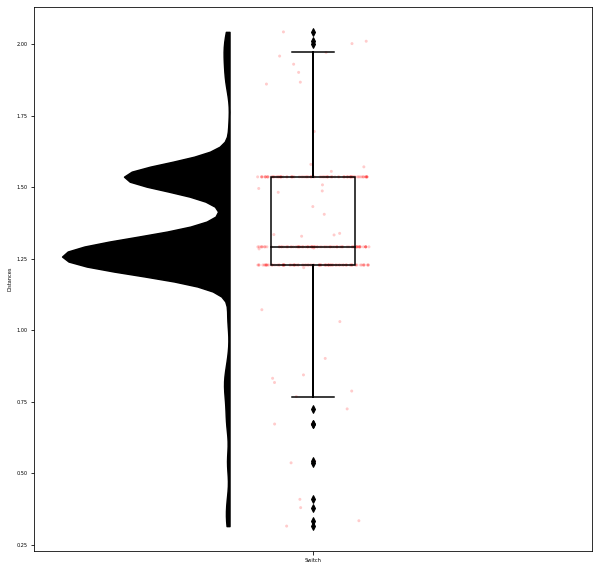

In [10]:
# plotting the clouds
f, ax = plt.subplots(figsize=(10, 10))
dy="distance"; dx="type"; ort="v"; pal = ['black','red']#sns.color_palette(n_colors=2)
ax=pt.half_violinplot( x = dx, y = dy, data = plot_df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)


pal1 = {"Stay": "grey", "Switch": "red"}
ax=sns.stripplot( x = dx, y = dy, data = plot_df, palette = pal1, edgecolor = "white",
size = 3, jitter = 1, zorder = 0, orient = ort, alpha = 0.2)

x=sns.boxplot( x = dx, y = dy, data = plot_df, color = "black", width = .15, zorder = 10,\
showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
saturation = 1, orient = ort)

plt.ylabel('Distances')
plt.xlabel('')

# Distances to chosen option

In [11]:
num_ins = 20
n_walks = 3

# initialize
switch_target_distance = []
previous_centroid_distance = []
mean_other_distance = []

i = 0

for id_ in range(num_ins):
    for walk in range(1, n_walks+1):

        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()

        ### calculate PCs
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = MinMaxScaler().fit_transform(hidden_units)  

        pcs = pca.fit_transform(st_hidden)

        # get x,y,z coordinates
        X = pcs[:,0]
        Y = pcs[:,1]
        Z = pcs[:,2]


        centroids = np.zeros([4, 3])
        for action in range(4):

            centroids[action,:] = [np.mean(X[df['choice'].values == action]),np.mean(Y[df['choice'].values == action]),np.mean(Z[df['choice'].values == action])]

        # get switch trials
        switch_t = np.where(df['is_switch']==1)

        # get switch actions
        switch_action = df['choice'].values[switch_t]
        
        
        # calculate distances
        for i, t in enumerate(switch_t[0]):

            action_centroid = centroids[switch_action[i],:]
            switch_point = [X[t],Y[t],Z[t]]
            
            # distance to switch target    
            switch_target_distance.append(np.linalg.norm(centroids[switch_action[i],:]-switch_point))
            # distance to previous action centroid
            previous_centroid_distance.append(np.linalg.norm(centroids[df['choice'].values[t-1],:]-switch_point))
            # mean other distance (except switch action or previous)
            dist = 0
            for action in range(4):
                if action != switch_action[i] and action != df['choice'].values[t-1]:
                    dist += np.linalg.norm(centroids[action,:]-switch_point)
            
            mean_other_distance.append(dist/2)
            dist = 0

#         # get stay t
#         stay_t = np.where(df['is_switch']==0)

#         # get stay action
#         stay_action = df['choice'].values[stay_t]

#         for i, t in enumerate(stay_t[0]):

#             action_centroid = centroids[stay_action[i],:]
#             stay_point = [X[t],Y[t],Z[t]]

#             stay_distances.append(np.linalg.norm(action_centroid-stay_point))

Text(0.5, 0, '')

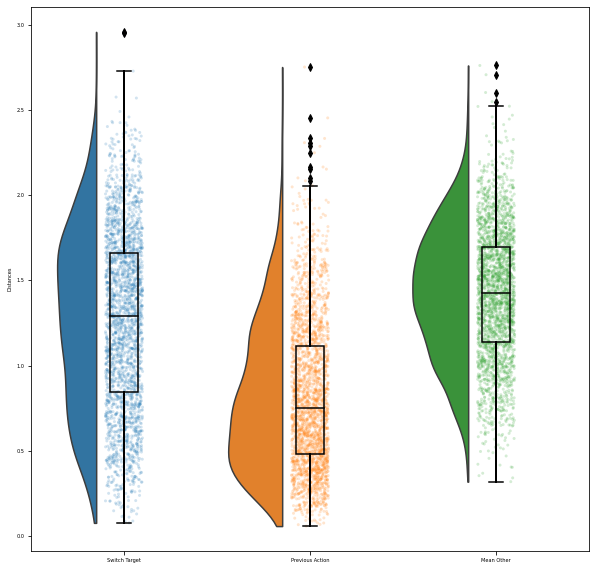

In [12]:
# Plotting
plot_df = pd.DataFrame({"distance": switch_target_distance + previous_centroid_distance + mean_other_distance,
                       "type": ['Switch Target'] * len(switch_target_distance) + 
                       ['Previous Action'] * len(previous_centroid_distance) + 
                       ['Mean Other'] * len(mean_other_distance)})

# plotting the clouds
f, ax = plt.subplots(figsize=(10, 10))
dy="distance"; dx="type"; ort="v"; pal = sns.color_palette(n_colors=3)
ax=pt.half_violinplot( x = dx, y = dy, data = plot_df, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)


#pal1 = {"Stay": "grey", "Switch": "red"}
ax=sns.stripplot( x = dx, y = dy, data = plot_df, palette = pal, edgecolor = "white",
size = 3, jitter = 1, zorder = 0, orient = ort, alpha = 0.2)

x=sns.boxplot( x = dx, y = dy, data = plot_df, color = "black", width = .15, zorder = 10,\
showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
saturation = 1, orient = ort)

plt.ylabel('Distances')
plt.xlabel('')

# Calculating distances for each instance

In [13]:
num_ins = 20
n_walks = 3

# initialize
switch_target_distance = [[] for _ in range(num_ins)]
previous_centroid_distance = [[] for _ in range(num_ins)]
min_other_distance = [[] for _ in range(num_ins)]
max_other_distance = [[] for _ in range(num_ins)]

i = 0

for id_ in range(num_ins):
    for walk in range(1, n_walks+1):

        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()

        ### calculate PCs
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = MinMaxScaler().fit_transform(hidden_units)  

        pcs = pca.fit_transform(st_hidden)

        # get x,y,z coordinates
        X = pcs[:,0]
        Y = pcs[:,1]
        Z = pcs[:,2]


        centroids = np.zeros([4, 3])
        for action in range(4):

            centroids[action,:] = [np.mean(X[df['choice'].values == action]),np.mean(Y[df['choice'].values == action]),np.mean(Z[df['choice'].values == action])]

        # get switch t
        switch_t = np.where(df['is_switch']==1)

        # get switch action
        switch_action = df['choice'].values[switch_t]

        for i, t in enumerate(switch_t[0]):

            action_centroid = centroids[switch_action[i],:]
            switch_point = [X[t],Y[t],Z[t]]
            
            # switch target    
            switch_target_distance[id_].append(np.linalg.norm(centroids[switch_action[i],:]-switch_point))
            # distance to previous centroid
            previous_centroid_distance[id_].append(np.linalg.norm(centroids[df['choice'].values[t-1],:]-switch_point))
            # min and max other distance (except switch action or previous action)
            dist = []
            for action in range(4):
                if action != switch_action[i] and action != df['choice'].values[t-1]:
                    dist.append(np.linalg.norm(centroids[action,:]-switch_point))
                    
            min_other_distance[id_].append(min(dist))
            max_other_distance[id_].append(max(dist))

#         # get stay t
#         stay_t = np.where(df['is_switch']==0)

#         # get stay action
#         stay_action = df['choice'].values[stay_t]

#         for i, t in enumerate(stay_t[0]):

#             action_centroid = centroids[stay_action[i],:]
#             stay_point = [X[t],Y[t],Z[t]]

#             stay_distances.append(np.linalg.norm(action_centroid-stay_point))

In [27]:
# Plotting
switch_target_medians_per_id = [np.median(ins) for ins in switch_target_distance]
min_other_medians_per_id = [np.median(ins) for ins in min_other_distance]
max_other_medians_per_id = [np.median(ins) for ins in max_other_distance]


x= np.vstack((min_other_medians_per_id, switch_target_medians_per_id, max_other_medians_per_id))



(117,)

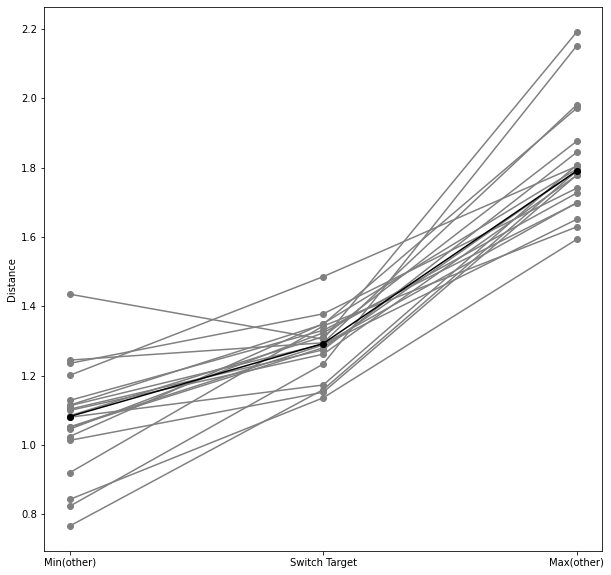

In [28]:
plt.plot(x, '-o', color = 'grey')

plt.plot(np.median(x, axis = 1), '-o', color = 'black')


plt.xticks([0,1, 2], ['Min(other)', 'Switch Target', 'Max(other)'])
plt.ylabel('Distance')
plt.show()

# 3D Curve fitting 

C:\Users\Bio_Psych\anaconda3\envs\tf_cpu\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


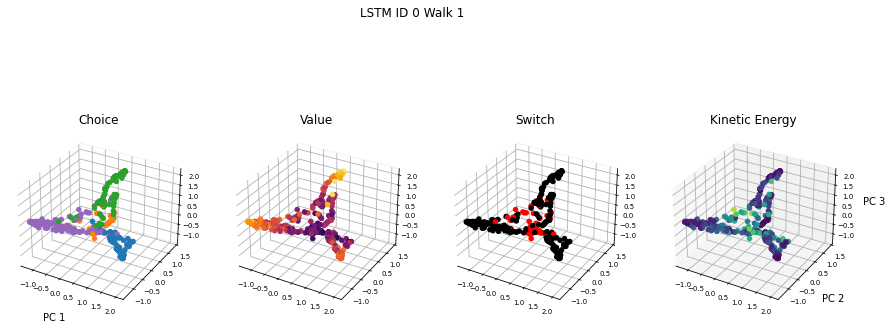

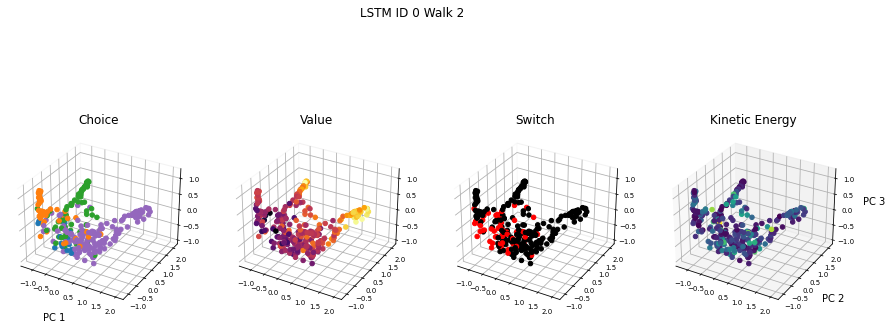

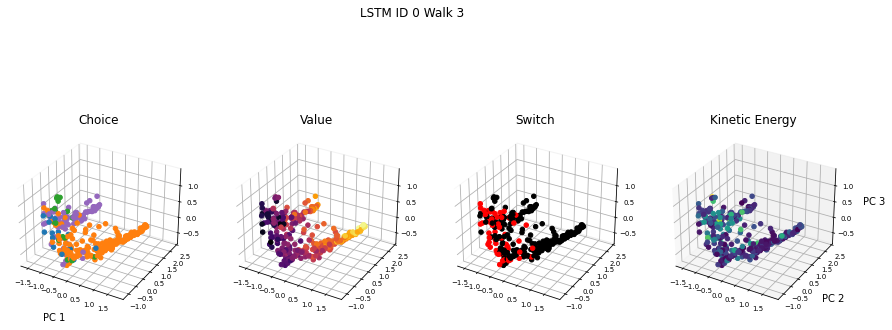

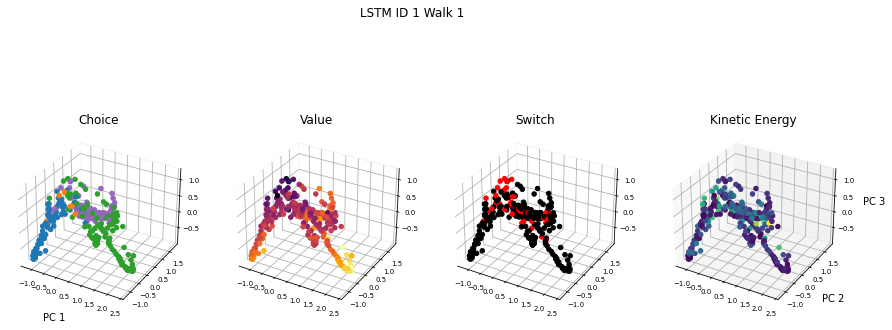

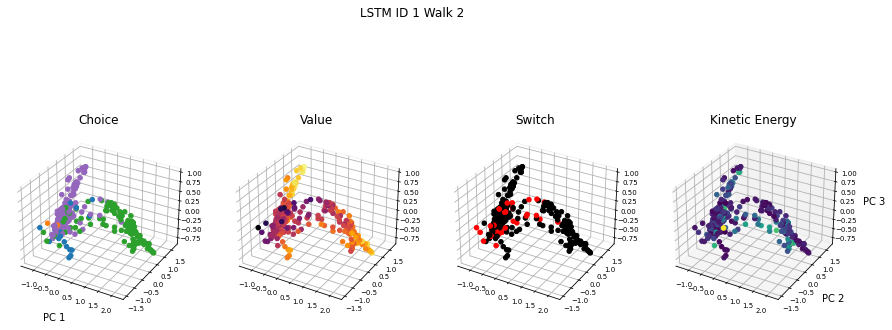

...

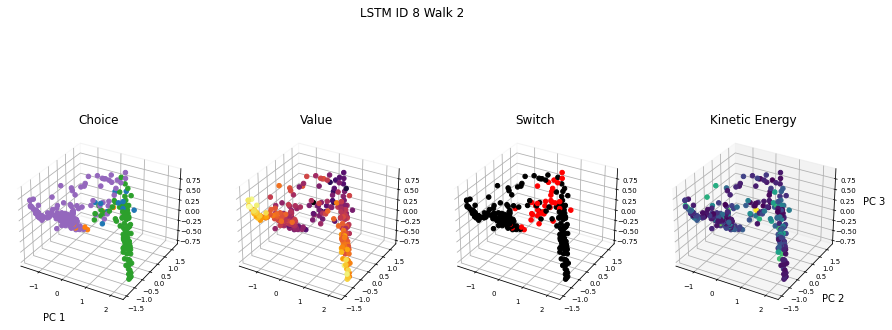

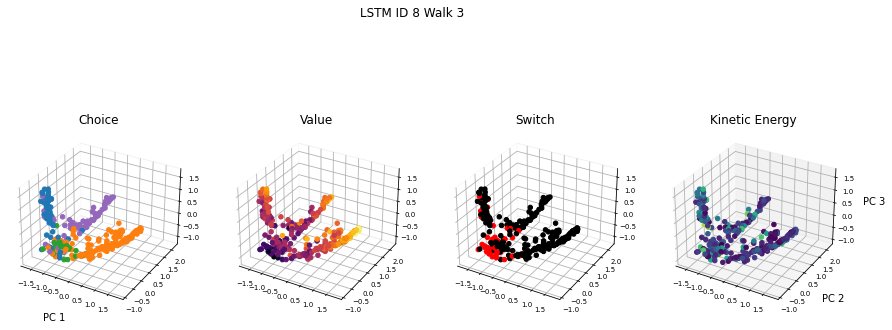

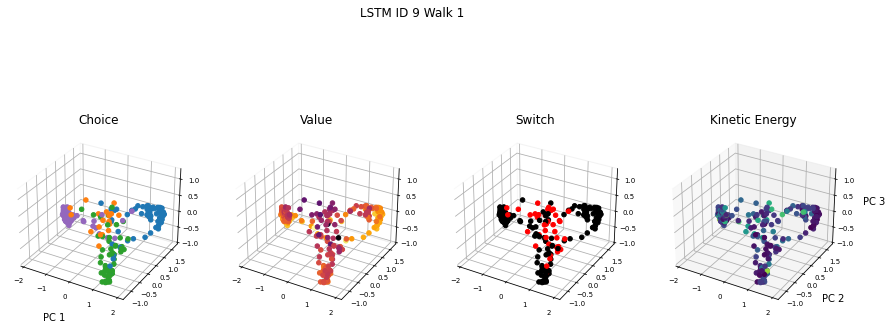

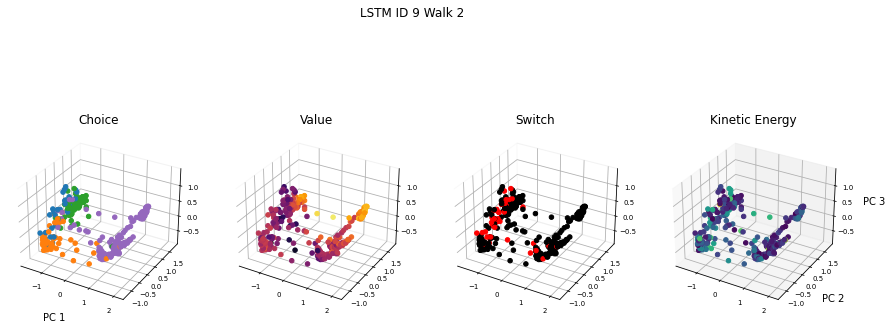

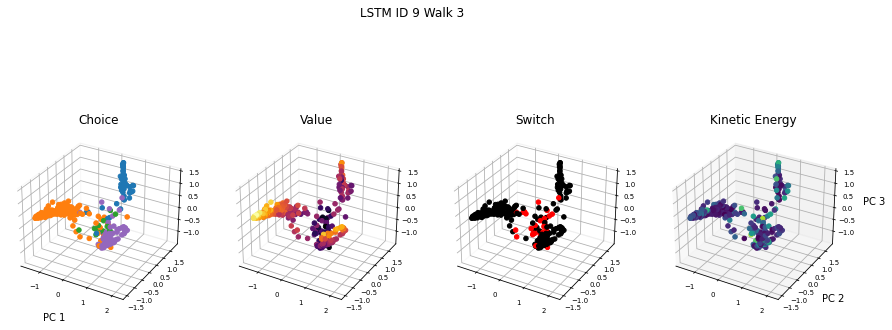

In [130]:
num_ins = 10
n_walks = 3

i = 0

for id_ in range(num_ins):
    for walk in range(1, n_walks+1):
        #


        d = pickle.load(open('data\\rnn_raw_data\\lstm2_a2c_nh_48_lr_0_0001_n_u_p_0_5_ew_0_vw_0_5_dr_0_5_res_d_f_p_0_1_rt_con_a_4_n_300_te_50000_id_{}_test_b_daw_p_{}'.format(id_, walk), 'rb'))
        df = d.reset_index()



        ### calculate PCs
        pca = PCA()
        hidden_units = df.loc[:, [col.startswith('rnn_state') for col in df.columns.values]]
        st_hidden = MinMaxScaler().fit_transform(hidden_units)  

        pcs = pca.fit_transform(st_hidden)

        # get x,y,z coordinates
        X = pcs[:,0]
        Y = pcs[:,1]
        Z = pcs[:,2]

        fig = plt.figure(figsize=(15,15))

        fig.suptitle('LSTM ID {} Walk {}'.format(id_, walk), y = 0.7)

        # create color for actions
        my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']

        ch_col = []

        for col in range(df['choice'].shape[0]):
            ch_col.append(my_cols[int(df['choice'].iloc[col])])

        # create color for switches
        my_cols = ['black', 'red']

        sw_col = []

        for col in range(df['is_switch'].shape[0]):
            sw_col.append(my_cols[int(df['is_switch'].iloc[col])])

        #First plot
        ax = fig.add_subplot(141, projection='3d')

        ax.scatter(X,Y,Z, color= ch_col, alpha = 1)

        ax.set_title('Choice')

        # styling
        ax.grid(True) 
        ax.w_xaxis.pane.fill = False
        ax.w_yaxis.pane.fill = False
        ax.w_zaxis.pane.fill = False

        # labels
        ax.set_xlabel('PC 1')
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

        ax = fig.add_subplot(142, projection='3d')

        x = ax.scatter(X,Y,Z, c= df['value'], alpha = 1, cmap = 'inferno', label = 'Value')

        ax.set_title('Value')
        #fig.colorbar(x, ax=ax)

        # styling
        ax.grid(True) 
        ax.w_xaxis.pane.fill = False
        ax.w_yaxis.pane.fill = False
        ax.w_zaxis.pane.fill = False

        # labels
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

        ax = fig.add_subplot(143, projection='3d')

        ax.scatter(X,Y,Z, color = sw_col, alpha = 1)

        ax.set_title('Switch')

        # styling
        ax.grid(True) 
        ax.w_xaxis.pane.fill = False
        ax.w_yaxis.pane.fill = False
        ax.w_zaxis.pane.fill = False

        # labels
#         ax.set_ylabel('PC 2')
#         ax.set_zlabel('PC 3')
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)
        
        ax = fig.add_subplot(144, projection='3d')
    
        ax.scatter(X[1:],Y[1:],Z[1:], c= momen, alpha = 1, cmap = 'viridis', label = 'Kinetic Energy')
        
        ax.set_title('Kinetic Energy')
        
        # labels
        ax.set_ylabel('PC 2')
        ax.set_zlabel('PC 3')
        ax.xaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.yaxis.set_tick_params(labelsize=7, pad = 0.01)
        ax.zaxis.set_tick_params(labelsize=7, pad = 0.01)

        
        




In [6]:
import scipy.optimize as optimize
import numpy as np

In [84]:
# A = np.array([(19,20,24), (10,40,28), (10,50,31)])

A = np.vstack([X, Y, Z])
x = np.transpose(A[:2,:])
y = A[2,:]

def func(data, a, b):
    return data[:,0]*data[:,1]*a + b

guess = (1,1)
params, pcov = optimize.curve_fit(func, x, A[2,:], guess)
print(params)

[ 1.76347455e-01 -1.45367052e-10]


In [88]:
pred = func(x, params[0], params[1])

<IPython.core.display.Javascript object>


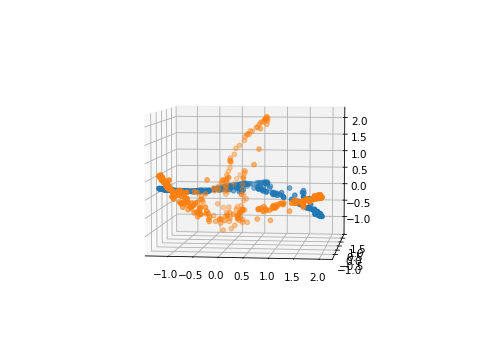

In [89]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(X,Y,pred)
ax.scatter(X,Y,Z)



In [41]:
A = np.array([(19,20,24), (10,40,28), (10,50,31)])

def func(data, a, b):
    return data[:,0]*data[:,1]*a + b

guess = (1,1)
params, pcov = optimize.curve_fit(func, A[:,:2], A[:,2], guess)
print(params)

[0.04919355 6.67741929]


In [100]:
# save files for Ioannis

# df1 = pd.DataFrame( {'X': X, 'Y': Y, 'Z': Z})
# df1.to_csv('3D_data.csv')

# Kinetic Energy

In [13]:
x = pcs[:, 0]
x_ = x[1:]
x = x_ - x[:-1]

y = pcs[:, 1]
y_ = y[1:]
y = y_- y[:-1]

z = pcs[:, 2]
z_ = z[1:]
z = z_- z[:-1]


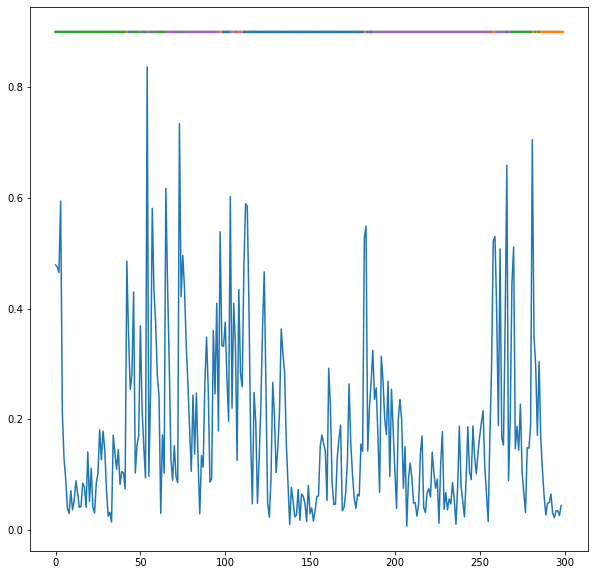

In [27]:

# plot kinetic energy
momen = np.array(list(map(lambda a: np.sqrt(a[0]**2+a[1]**2+a[2]**2), zip(x,y,z))))
plt.plot(np.arange(len(momen)), momen,  alpha= 1)


# plot choices 
my_choices = df['choice'].values

my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']


# create color for actions
tmp_col = []

for col in range(len(my_choices)):
    tmp_col.append(my_cols[int(my_choices[col])])

plt.scatter(range(len(my_choices)), [0.9]*len(my_choices), c = tmp_col, s = 3)


plt.show()

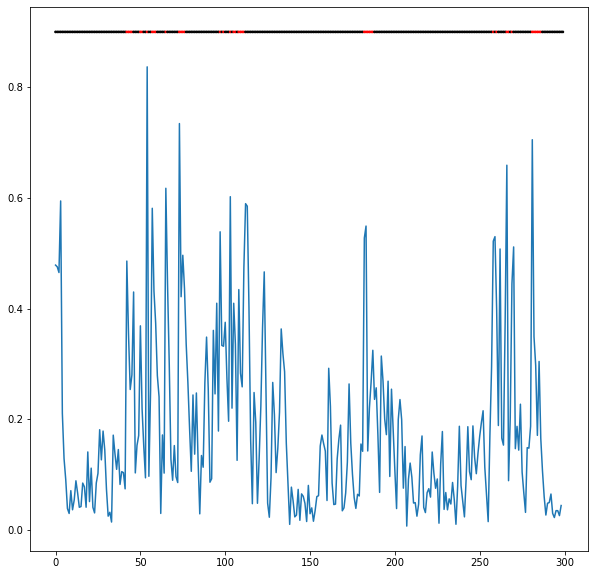

In [95]:
# plot kinetic energy
# momen = np.array(list(map(lambda a: np.sqrt(a[0]**2+a[1]**2+a[2]**2), zip(x,y,z))))
plt.plot(np.arange(len(momen)), momen,  alpha= 1)


# plot choices 
my_choices = df['choice'].values

my_cols = ['tab:blue','tab:orange','tab:green','tab:purple']


# create color for actions
# tmp_col = []

# for col in range(len(my_choices)):
#     tmp_col.append(my_cols[int(my_choices[col])])

plt.scatter(range(len(my_choices)), [0.9]*len(my_choices), c = sw_col, s = 3)


plt.show()

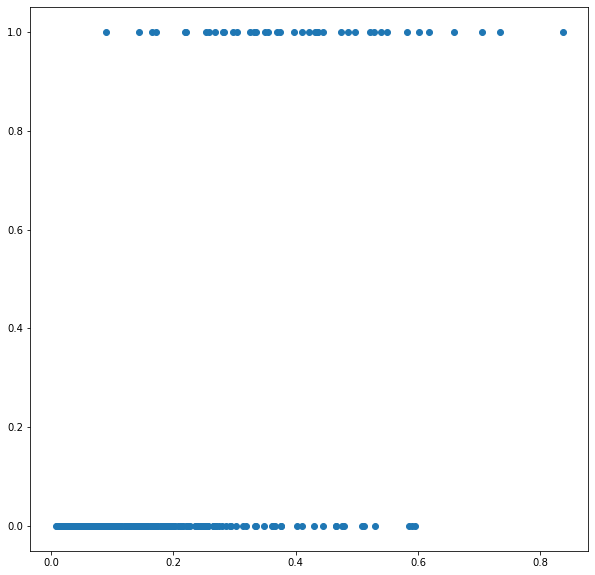

In [115]:
plt.scatter(momen, df['is_switch'].values[:-1])

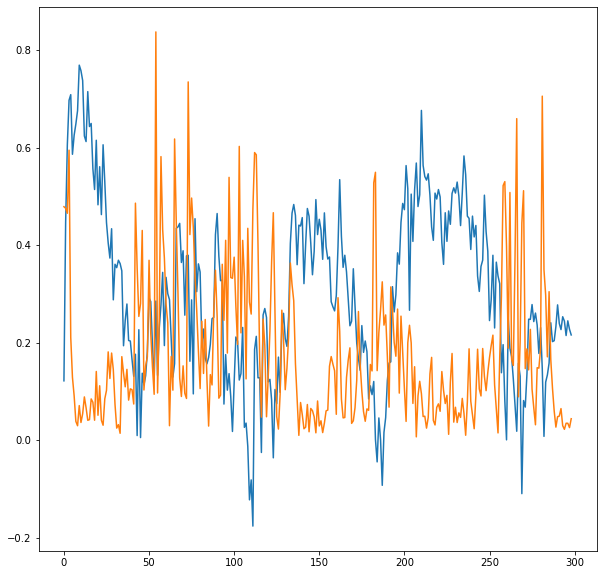

In [116]:
plt.plot(df.value.values[:-1])
plt.plot(momen)

In [112]:
# does energy track finite differences of task varriables

val_delta = df.value.values[1:] - df.value.values[:-1]

rew_delta = df.reward.values[1:] - df.reward.values[:-1]


In [120]:


print(np.corrcoef(df.reward.values[:-1], momen))
print(np.corrcoef(df.value.values[:-1], momen))
print(np.corrcoef(rew_delta, momen))
print(np.corrcoef(val_delta, momen))

print(np.corrcoef(df.is_switch.values[:-1], momen))



[[ 1.         -0.40526809]
 [-0.40526809  1.        ]]
[[ 1.         -0.39454368]
 [-0.39454368  1.        ]]
[[1.         0.11398413]
 [0.11398413 1.        ]]
[[1.         0.03143306]
 [0.03143306 1.        ]]
[[1.       0.579545]
 [0.579545 1.      ]]


In [117]:
t = np.array([1,2,3,4])
t[:-1]

array([1, 2, 3])

,choice,is_switch
0,2,0
1,2,0
2,2,0
3,2,0
4,2,0
...,...,...
295,1,0
296,1,0
297,1,0
298,1,0
